In [1]:
import cv2
import numpy as np
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt

from view_test_tiles import display_video_clip


from dataset.build_dataset import threshold_image, cloud_idx, get_cloud_idx_from_image_path, get_cloud_idx_from_img

output_dir = "../airmassRGB/supervised/"

# copertura nuvolosa

In [2]:
# carica immagine AirmassRGB
image_path = "../airmassRGB/supervised/09-09-2023_2355_639_196/img_00010.png"
img = cv2.imread(image_path)  # BGR → converti in RGB se serve
if img is None:
    raise FileNotFoundError(f"Impossibile caricare l'immagine: {image_path}")

# ricava luminosità
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# trova soglia automatica
_, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# mask nuvole (white)
cloud_mask = thresh == 255

# percentuale di pixel nuvolosi
cloud_frac = cloud_mask.mean()

if cloud_frac > 0.05:
    print("Frame coperto da nuvole")
else:
    print("Frame sereno")


Frame coperto da nuvole


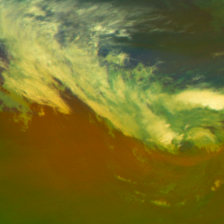

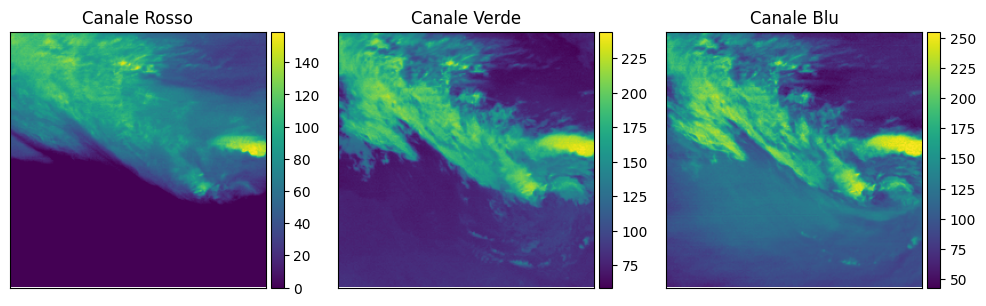

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

def make_channel_plot(img, ax, fig, ch_name='', vmin=0, vmax=255):
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    imm = ax.imshow(img, vmin=vmin, vmax=vmax)
    fig.colorbar(imm, cax=cax, orientation='vertical')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f"Channel {ch_name}")


display(Image.open(image_path))

fig, axs = plt.subplots(1,3, figsize=(12, 4))
make_channel_plot(img[:,:,0], axs[0], fig, ch_name="Red")
make_channel_plot(img[:,:,1], axs[1], fig, ch_name="Green")
make_channel_plot(img[:,:,2], axs[2], fig, ch_name="Blue")


In [4]:
# calcola la soglia come percentile (es. 95° percentile)
p = 60
thresh_val = np.percentile(gray, p)

#thresh_val = 100
# genera la maschera
cloud_mask = gray > thresh_val
cloud_frac = cloud_mask.mean()

print(f"Soglia (percentile {p}): {thresh_val:.1f}")
print(f"Frazione di pixel nuvolosi: {cloud_frac*100:.2f} %")

Soglia (percentile 60): 97.0
Frazione di pixel nuvolosi: 39.89 %


Text(0.5, 1.0, 'Percentuale nuvolosa: 0.25')

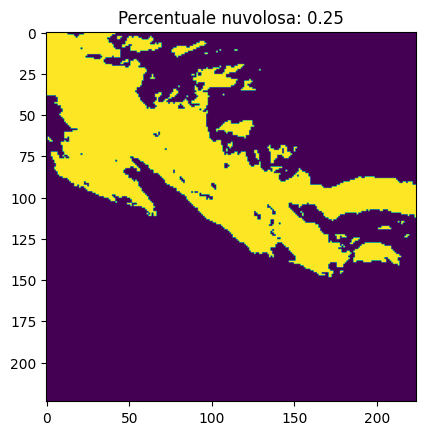

In [ ]:
cloud_mask = threshold_image(img)
plt.imshow(cloud_mask)
cl_idx = cloud_idx(cloud_mask)
plt.title(f"Percentuale nuvolosa: {cl_idx}")
plt.xticks([])
plt.yticks([])
plt.savefig("cloud_mask.png")

In [148]:
#img = cv2.imread(image_path) 
# -> apre come array

In [35]:
from arguments import prepare_finetuning_args, Args
from dataset import build_dataset
from torch.utils.data import DataLoader

args = prepare_finetuning_args()
##### prende da val_supervised.csv
dataset_val, _ = build_dataset(is_train=False, test_mode=False, args=args)  

data_loader_val = DataLoader(
    dataset_val,
    batch_size=args.batch_size,
    shuffle=True,         # Per estrarre sample casuali
    num_workers=args.num_workers,
    pin_memory=args.pin_mem,
    drop_last=False
)

get_prediction = False


Number of the class = 2


In [36]:
it = iter(dataset_val)

In [37]:
it.__sizeof__(), len(dataset_val)

(32, 890)

In [52]:
samples = next(it)  # samples è una tupla tipicamente (video, label, index, ...)
videos = samples[0]  # tensore di shape [B, C, T, H, W] 
labels = samples[1]  # shape [B]
folder_path = samples[2]
print(folder_path)


v0 = videos#[0]  # shape [C, T, H, W]
v0 = v0.permute(1, 2, 3, 0).cpu()  # [T, H, W, C]
#print(v0)


v0_min = v0.min()
v0_max = v0.max()
v0_vis = (v0 - v0_min) / (v0_max - v0_min + 1e-5)  # normalizzato [0,1]

masks = []
for v in v0_vis:
    im = v.numpy()
    cld_idx = get_cloud_idx_from_img(im*255)
    masks.append(threshold_image(im*255))
    #print(cld_idx)

INDICE: 10
../airmassRGB/supervised/19-02-2020_2255_852_0


In [53]:
video_display = display_video_clip(v0_vis)
display(video_display)

In [54]:
video_display = display_video_clip(masks) #v0_vis)
display(video_display)

# Verifica su immagine intera a un dato istante

In [4]:
# Calcolo cloud index per tutte le immagini del periodo di Juliette, per-tile (stride di default)
import pandas as pd
from medicane_utils.load_files import load_all_images_in_intervals
from dataset.build_dataset import calc_tile_offsets, create_df_unlabeled_tiles_from_metadatafiles, add_cloud_idx_to_master_df

# 1) Finestra temporale di Juliette dal CSV
csv_path = 'medicane_data_input/medicanes_new_windows.csv'
df_windows = pd.read_csv(csv_path, parse_dates=['time', 'start_time', 'end_time'])
df_jul = df_windows[df_windows['name'] == 'Juliette'].copy()
assert not df_jul.empty, 'Nessuna riga trovata per Juliette nel CSV.'
jul_start = df_jul['start_time'].min()
jul_end   = df_jul['end_time'].max()
print(f'Intervallo Juliette: {jul_start} -> {jul_end}')

# 2) Carica tutte le immagini nell'intervallo
input_dir = '../fromgcloud'  # cartella con i PNG airmass_rgb_YYYYMMDD_HHMM.png
intervals = pd.DataFrame({'min': [jul_start], 'max': [jul_end]})
sorted_metadata_files = load_all_images_in_intervals(input_dir, intervals)
print(f'Immagini trovate nel periodo: {len(sorted_metadata_files)}')
assert len(sorted_metadata_files) > 0, 'Nessuna immagine trovata nel periodo selezionato.'

# 3) Genera offsets di default per le tile e crea DF per-tile
offsets_for_frame = calc_tile_offsets()  # usa stride_x=213, stride_y=196 di default
print(f'Numero di tile per immagine: {len(offsets_for_frame)}')
df_tiles = create_df_unlabeled_tiles_from_metadatafiles(sorted_metadata_files, offsets_for_frame)
print('Righe per-tile:', len(df_tiles))

# 4) Calcolo cloud index per tile (lettura immagine una sola volta per path)
df_juliette_cloud_tiles = add_cloud_idx_to_master_df(df_tiles, col_name='cloud_idx', tile_size=224, efficient=True, green_col_name='green_mean')
print('Shape finale:', df_juliette_cloud_tiles.shape)

Intervallo Juliette: 2023-02-27 19:00:00 -> 2023-03-02 13:30:00
Immagini trovate nel periodo: 797
Numero di tile per immagine: 12
Righe per-tile: 9564
Shape finale: (9564, 6)


In [5]:
df_tiles

,path,datetime,tile_offset_x,tile_offset_y,cloud_idx,green_mean
0,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,0,0,0.001,77.465163
1,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,213,0,0.148,101.777483
2,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,426,0,0.043,92.138473
3,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,639,0,0.280,117.590780
4,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,852,0,0.465,149.142439
...,...,...,...,...,...,...
9559,../fromgcloud/airmass_rgb_20230302_1330.png,2023-03-02 13:30:00,213,196,0.007,87.433853
9560,../fromgcloud/airmass_rgb_20230302_1330.png,2023-03-02 13:30:00,426,196,0.137,95.004345
9561,../fromgcloud/airmass_rgb_20230302_1330.png,2023-03-02 13:30:00,639,196,0.021,62.041315
9562,../fromgcloud/airmass_rgb_20230302_1330.png,2023-03-02 13:30:00,852,196,0.136,87.879803


In [ ]:

# 5) Output rapido
display(df_juliette_cloud_tiles.head(20))



,path,datetime,tile_offset_x,tile_offset_y,cloud_idx
0,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,0,0,0.001
1,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,213,0,0.148
2,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,426,0,0.043
3,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,639,0,0.280
4,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,852,0,0.465
5,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,1065,0,0.462
6,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,0,196,0.000
7,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,213,196,0.000
8,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,426,196,0.214
9,../fromgcloud/airmass_rgb_20230227_1900.png,2023-02-27 19:00:00,639,196,0.371


Shape finale: (9564, 5)


Timestamp disponibili: 797


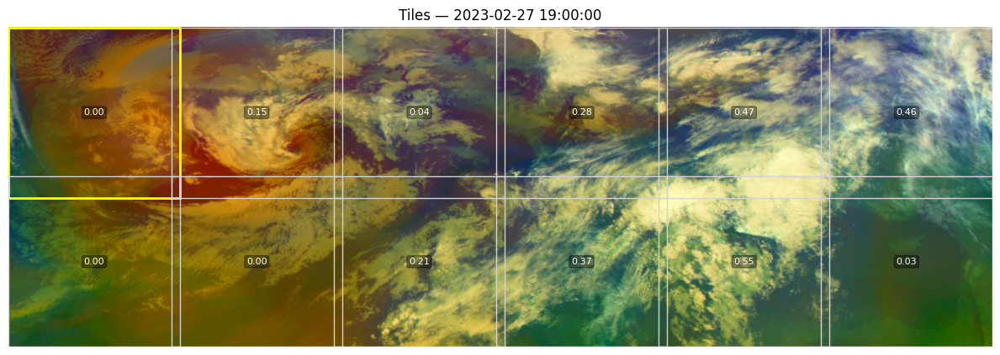

In [ ]:
# Versione aggiornata: mostra tutte le tile con riquadri e cloud index scritto all'interno
import cv2
import matplotlib.pyplot as plt

assert 'df_juliette_cloud_tiles' in globals(), 'Esegui prima la cella di calcolo'
available_times = sorted(df_juliette_cloud_tiles['datetime'].unique())
print(f'Timestamp disponibili: {len(available_times)}')

# Selezione manuale
sel_time = available_times[0]
tile_idx = 0  # indice tile da evidenziare

dft = df_juliette_cloud_tiles[df_juliette_cloud_tiles['datetime']==sel_time].copy()
assert not dft.empty, 'Nessuna tile per il timestamp selezionato'
dft.sort_values(['tile_offset_y','tile_offset_x'], inplace=True)
dft.reset_index(drop=True, inplace=True)
img_path = dft['path'].iloc[0]
im_bgr = cv2.imread(str(img_path)); im_rgb = cv2.cvtColor(im_bgr, cv2.COLOR_BGR2RGB)

fig, ax = plt.subplots(figsize=(12,5))
ax.imshow(im_rgb)
for i, r in dft.iterrows():
    x = int(r['tile_offset_x']); y = int(r['tile_offset_y']); c = float(r['cloud_idx'])
    color = 'yellow' if i == tile_idx else 'lightgray'
    lw = 2 if i == tile_idx else 1
    rect = plt.Rectangle((x, y), 224, 224, edgecolor=color, facecolor='none', linewidth=lw)
    ax.add_patch(rect)
    ax.text(x + 112, y + 112, f'{c:.2f}', color='white', ha='center', va='center',
            fontsize=8, bbox=dict(facecolor='black', alpha=0.35, boxstyle='round,pad=0.2'))
ax.set_title(f'Cloud Index per Tiles — {sel_time}')
ax.axis('off')
plt.tight_layout(); plt.show()


In [6]:
# Versione aggiornata con ipywidgets: tutte le tile + cloud index; tile selezionata evidenziata
try:
    import ipywidgets as widgets
    from IPython.display import display
    import matplotlib.pyplot as plt
    import cv2

    def tiles_for_time(t):
        return len(df_juliette_cloud_tiles[df_juliette_cloud_tiles['datetime']==t])

    time_dd = widgets.Dropdown(options=available_times, description='Datetime:')
    tile_slider = widgets.IntSlider(value=0, min=0, max=max(0, tiles_for_time(available_times[0])-1), step=1, description='Tile idx:')
    out = widgets.Output()

    def update_tile_slider(*args):
        n = tiles_for_time(time_dd.value)
        tile_slider.max = max(0, n-1)
        tile_slider.value = 0
    time_dd.observe(update_tile_slider, names='value')

    def render(change=None):
        with out:
            out.clear_output()
            tsel = time_dd.value; idx = tile_slider.value
            dft = df_juliette_cloud_tiles[df_juliette_cloud_tiles['datetime']==tsel].copy()
            dft.sort_values(['tile_offset_y','tile_offset_x'], inplace=True)
            dft.reset_index(drop=True, inplace=True)
            p = dft['path'].iloc[0]
            im_bgr = cv2.imread(str(p)); im_rgb = cv2.cvtColor(im_bgr, cv2.COLOR_BGR2RGB)
            fig, ax = plt.subplots(figsize=(12,5))
            ax.imshow(im_rgb)
            for i, r in dft.iterrows():
                x = int(r['tile_offset_x']); y = int(r['tile_offset_y']); c = float(r['cloud_idx'])
                color = 'yellow' if i == idx else 'lightgray'
                lw = 2 if i == idx else 1
                rect = plt.Rectangle((x, y), 224, 224, edgecolor=color, facecolor='none', linewidth=lw)
                ax.add_patch(rect)
                ax.text(x + 112, y + 112, f'{c:.2f}', color='white', ha='center', va='center',
                        fontsize=8, bbox=dict(facecolor='black', alpha=0.35, boxstyle='round,pad=0.2'))
            ax.set_title(f'Tiles — {tsel}')
            ax.axis('off')
            plt.tight_layout(); plt.show()

    tile_slider.observe(render, names='value')
    time_dd.observe(render, names='value')
    display(widgets.VBox([time_dd, tile_slider, out]))
    render()
except Exception as e:
    print('ipywidgets non disponibile; usa la cella manuale sopra.')


ipywidgets non disponibile; usa la cella manuale sopra.


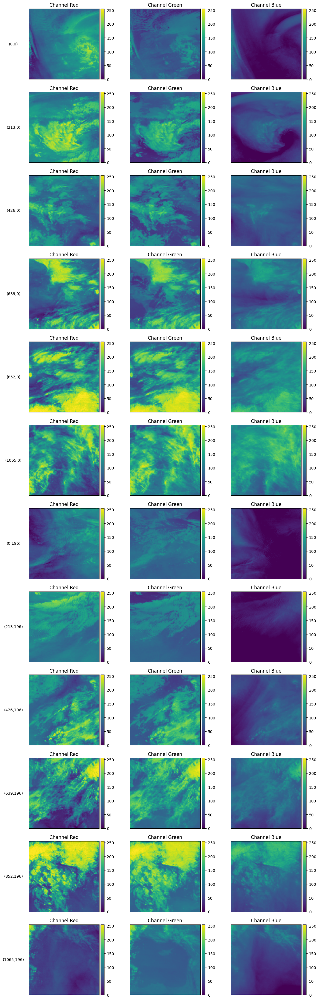

In [11]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.pyplot as plt
import numpy as np
import cv2

from dataset.build_dataset import calc_tile_offsets

def make_channel_plot(img, ax, fig, ch_name='',vmin=0, vmax=255):
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    imm = ax.imshow(img, vmin=vmin, vmax=vmax)
    fig.colorbar(imm, cax=cax, orientation='vertical')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'Channel {ch_name}')

# Scegli un frame intero del Mediterraneo
try:
    image_path = sorted_metadata_files[0][0]
except Exception:
    image_path = '../fromgcloud/airmass_rgb_20230227_1900.png'

img_bgr = cv2.imread(str(image_path))
if img_bgr is None:
    raise FileNotFoundError(f"Impossibile caricare l'immagine: {image_path}")

# BGR -> RGB
img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Offsets e parametri tile
tile_size = 224
offsets = calc_tile_offsets()
n = len(offsets)

fig, axes = plt.subplots(n, 3, figsize=(12, 3*n))
if n == 1:
    axes = np.array([axes])

for i, (x, y) in enumerate(offsets):
    tile = img[y:y + tile_size, x:x + tile_size, :]
    if tile.shape[0] != tile_size or tile.shape[1] != tile_size:
        for j in range(3):
            axes[i, j].axis('off')
        continue

    make_channel_plot(tile[:, :, 0], axes[i, 0], fig, ch_name='Red', vmin=0, vmax=255)
    make_channel_plot(tile[:, :, 1], axes[i, 1], fig, ch_name='Green', vmin=0, vmax=255)
    make_channel_plot(tile[:, :, 2], axes[i, 2], fig, ch_name='Blue', vmin=0, vmax=255)
    axes[i, 0].set_ylabel(f'({x},{y})', rotation=0, labelpad=40, va='center')

plt.tight_layout()
plt.show()


# Calcolo copertura nuvolosa per tutto il dataset

devo aggiungere una colonna cloud idx nel master dataframe

In [3]:
from dataset.data_manager import BuildDataset

In [4]:
sup_data_train = BuildDataset(type='SUPERVISED', master_df_path="all_data_full_tiles.csv")
sup_data_train.load_master_df()

In [ ]:
#sup_data_train.master_df['cloud_idx'] = sup_data_train.master_df.iloc[:1000].path.apply(get_cloud_idx_from_image_path)

In [ ]:
sup_data_train.make_df_video(output_dir="../airmassRGB/supervised", is_to_balance=True)

In [50]:
sup_data_train.df_video.path = output_dir + sup_data_train.df_video.path

In [51]:
sup_data_train.df_video.shape

(4756, 8)

In [4]:
from dataset.build_dataset import calc_avg_cld_idx


In [53]:
new_col_name = "avg_cloud_idx"
#for i in range(2):
#    subfolder = Path(sup_data_train.df_video.iloc[i].path)
#sub = sup_data_train.df_video.iloc[:100].copy()
sup_data_train.df_video[new_col_name] = sup_data_train.df_video.path.apply(calc_avg_cld_idx)

In [60]:
sup_data_train.df_video.path = sup_data_train.df_video.path.str.split('/').str[-1]


In [61]:
mask_cloud = sup_data_train.df_video.avg_cloud_idx > 0.2
df_video_cloudy = sup_data_train.df_video[mask_cloud]
df_video_clearsky = sup_data_train.df_video[~mask_cloud]
len(df_video_cloudy), len(df_video_clearsky)

(1219, 3537)

In [62]:
train_len = int(0.7 * len(df_video_cloudy))
#test_len = int(0.7 * len(df_video_cloudy))
cloudy_train = df_video_cloudy.sample(train_len, random_state=1)
cloudy_test = df_video_cloudy.drop(cloudy_train.index)
len(cloudy_train), len(cloudy_test)

(853, 351)

In [ ]:
from dataset.build_dataset import create_final_df_csv



df_dataset_csv_cloudy_train = create_final_df_csv(cloudy_train, output_dir)
df_dataset_csv_cloudy_train.to_csv("cloudy_train_853.csv", index=False)

df_dataset_csv_cloudy_test = create_final_df_csv(cloudy_test, output_dir)
df_dataset_csv_cloudy_test.to_csv("cloudy_test_351.csv", index=False)